In [10]:
from glob import glob
import numpy as np
import cv2
from tqdm import tqdm
import random
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
# from sklearn.mixture import GaussianMixture

In [60]:
new_image_size = (256, 256)
alpha = 1.2

def preprocess(image):
    image = cv2.imread(image)

    image = cv2.resize(image, new_image_size)

    # # Adjust the contrast of the image
    # image = cv2.convertScaleAbs(image, alpha=alpha)

    # # Clip the pixel values to the range of 0 to 255
    # image = np.clip(image, 0, 255).astype(np.uint8)

    # image = image / 255

    return image


In [71]:

image_paths = glob("/home/mykang/mmsegmentation/data/Satellite/img_dir/val_slice/*.png")[:1500]
# Shuffle the list randomly
# random.shuffle(image_paths)

images = [preprocess(image) for image in tqdm(image_paths)]
image_data = np.array(images)

100%|██████████| 1500/1500 [00:05<00:00, 295.38it/s]


In [72]:
image_data_flatten = image_data.reshape(len(image_paths), new_image_size[0] * new_image_size[1] * 3)
image_data_flatten.shape

(1500, 196608)

In [73]:
# Apply PCA for dimensionality reduction
pca = PCA(n_components=150)  # Choose the number of components for PCA
image_data_reduced = pca.fit_transform(image_data_flatten)

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=2031, verbose=True, )
clusters = kmeans.fit_predict(image_data_reduced)

/home/mykang/anaconda3/envs/mmseg/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Initialization complete
Iteration 0, inertia 525117990377.15735.
Iteration 1, inertia 295088021095.20404.
Iteration 2, inertia 289619417275.8456.
Iteration 3, inertia 287944709082.20593.
Iteration 4, inertia 287381841837.7172.
Iteration 5, inertia 287099461555.5054.
Iteration 6, inertia 287011271229.26636.
Iteration 7, inertia 286885173126.14984.
Iteration 8, inertia 286750211707.1558.
Iteration 9, inertia 286614029417.94867.
Iteration 10, inertia 286519912954.8429.
Iteration 11, inertia 286495615187.1502.
Iteration 12, inertia 286473415682.147.
Iteration 13, inertia 286464883511.62933.
Iteration 14, inertia 286460139776.7748.
Iteration 15, inertia 286451043786.43787.
Iteration 16, inertia 286446505502.4995.
Converged at iteration 16: strict convergence.
Initialization complete
Iteration 0, inertia 460373629144.24365.
Iteration 1, inertia 307594038938.69495.
Iteration 2, inertia 297449529449.14813.
Iteration 3, inertia 295041804978.0174.
Iteration 4, inertia 294591564201.7778.
Iteratio

In [ ]:
# # Perform K-means clustering
# kmeans = KMeans(n_clusters=3, init='k-means++', random_state=2031, verbose=True, )
# clusters = kmeans.fit_predict(image_data_flatten)

In [61]:
# # Perform K-means clustering
# kmeans = MiniBatchKMeans(n_clusters=5, random_state=203, batch_size=100, verbose=True)
# clusters = kmeans.fit_predict(image_data_flatten)

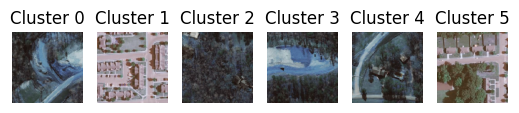

In [74]:
import matplotlib.pyplot as plt

# Count the number of images in each cluster
cluster_counts = np.bincount(clusters)

num_clusters = len(np.unique(clusters))

# Visualize representative images from each cluster
for cluster_index in range(num_clusters):
    cluster_images = image_data[clusters == cluster_index]
    representative_image = cluster_images[0]  # Choose the first image as representative
    # representative_image = representative_image.reshape(image_shape)  # Reshape to original shape
    plt.subplot(1, num_clusters, cluster_index + 1)
    plt.imshow(representative_image)
    plt.axis('off')
    plt.title(f'Cluster {cluster_index}')

plt.show()

In [75]:
# Count the number of instances in each cluster
cluster_counts = np.bincount(clusters)

# Print the number of instances in each cluster
for cluster_index, count in enumerate(cluster_counts):
    print(f"Cluster {cluster_index}: {count} instances")

Cluster 0: 168 instances
Cluster 1: 106 instances
Cluster 2: 294 instances
Cluster 3: 243 instances
Cluster 4: 459 instances
Cluster 5: 230 instances


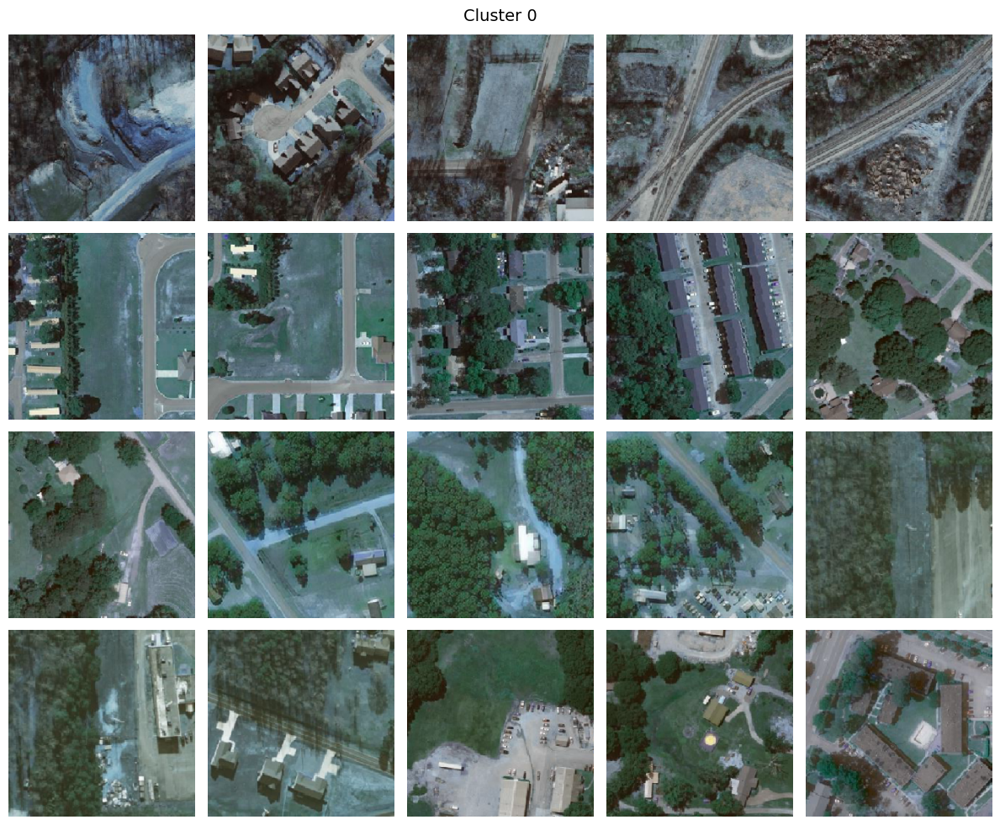

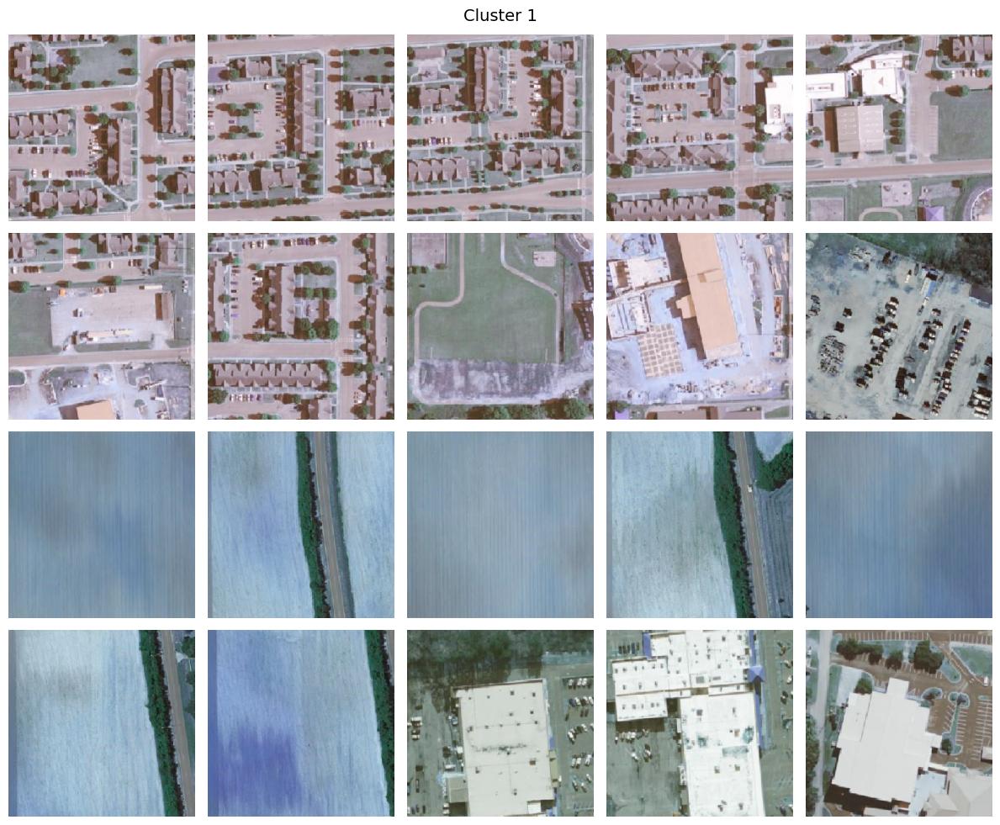

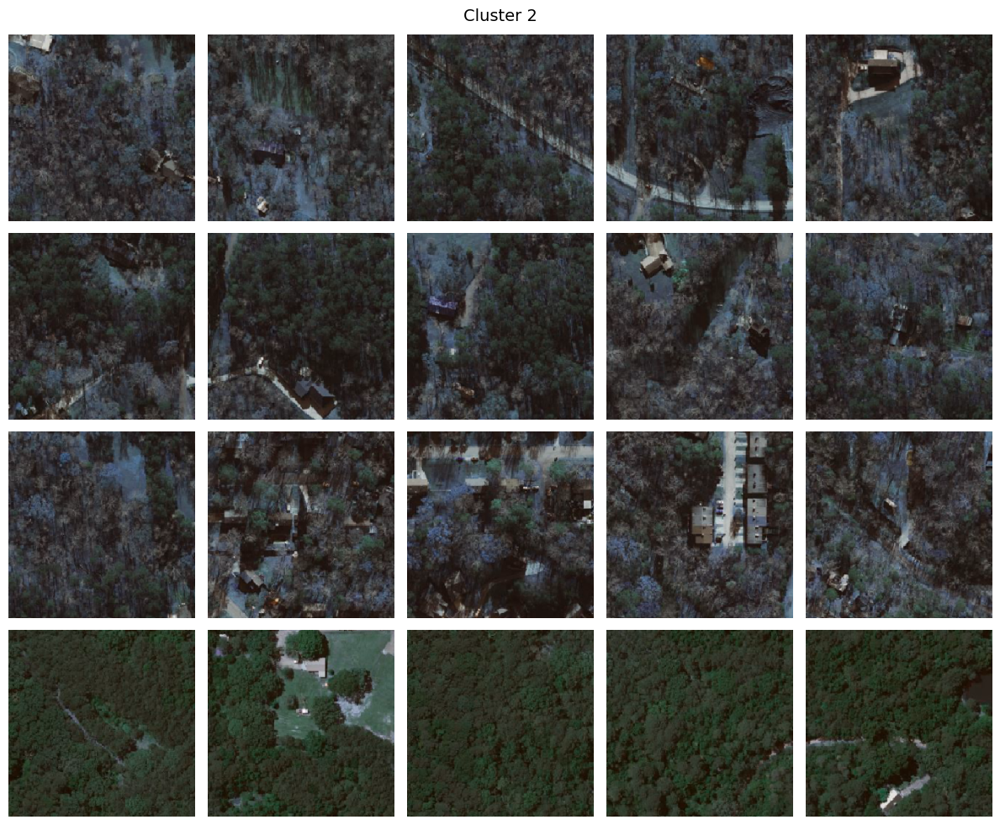

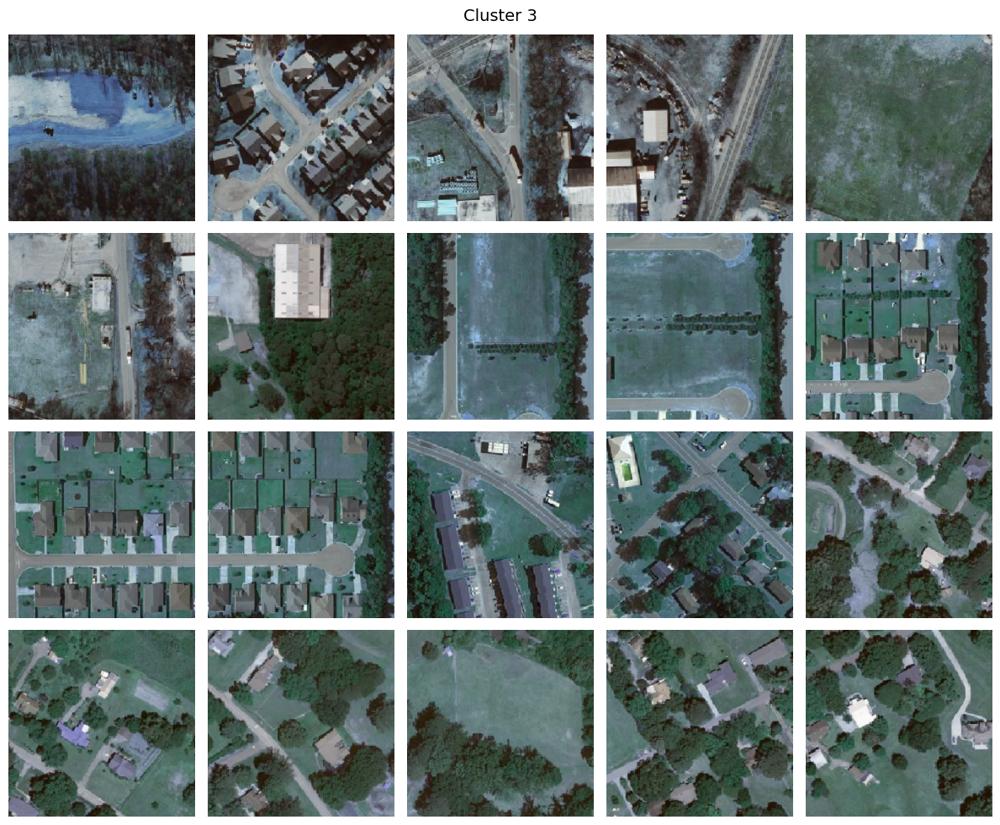

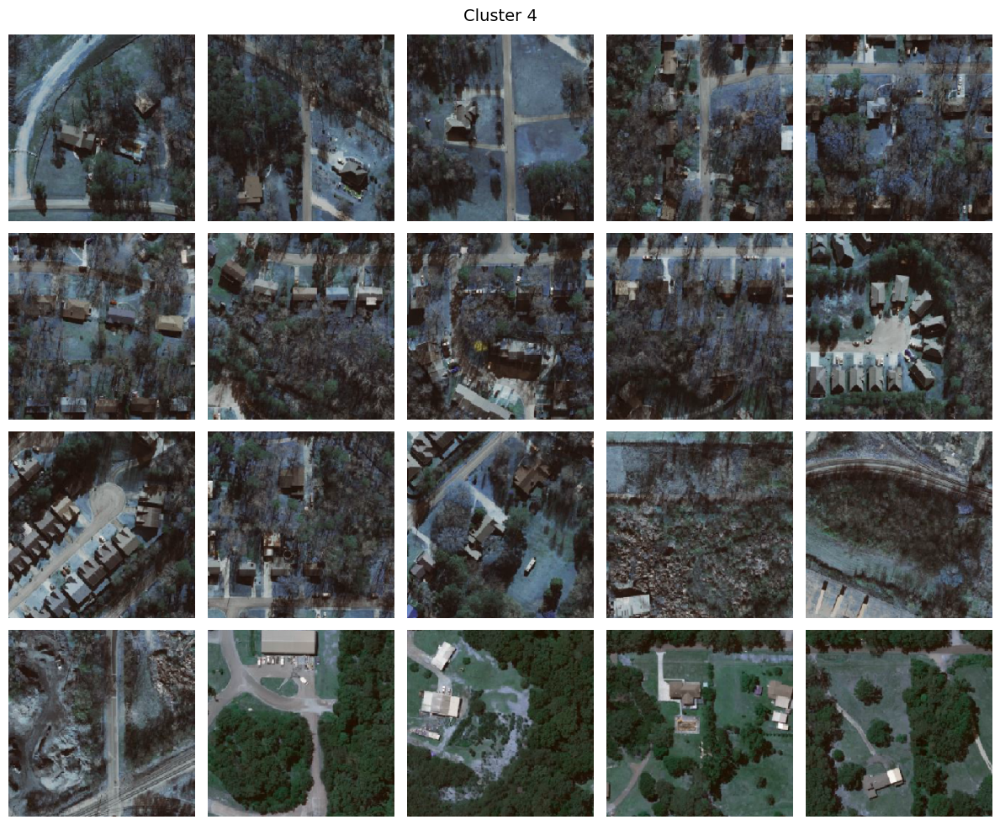

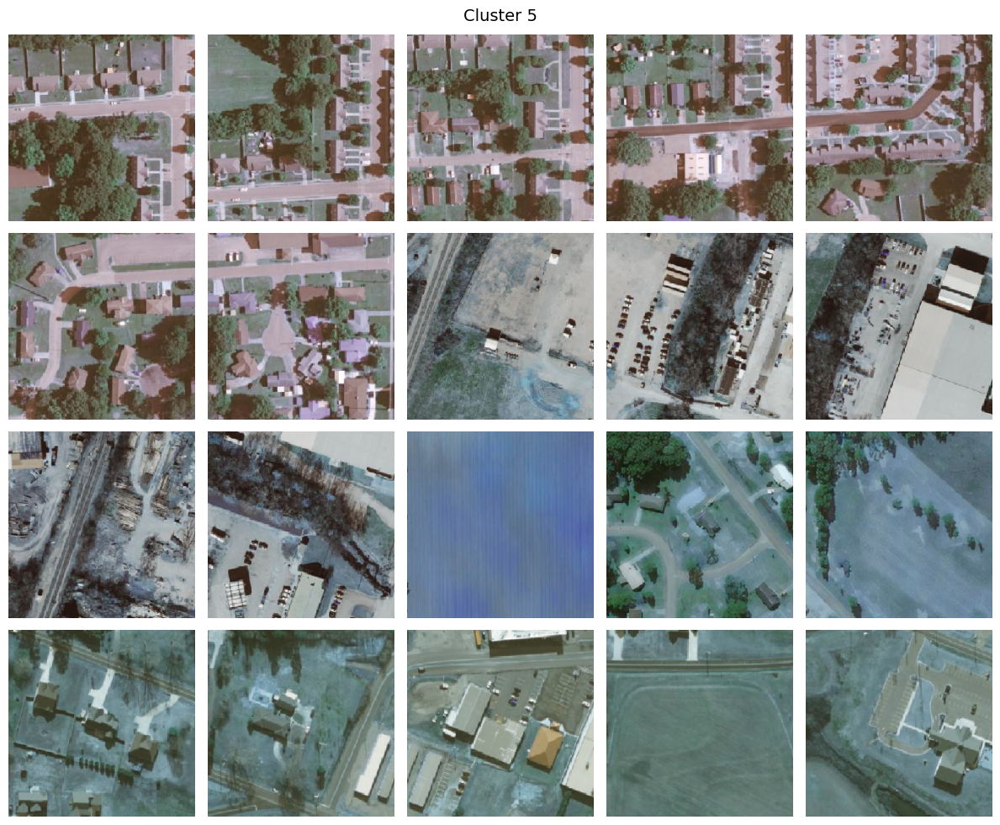

In [76]:

num_clusters = len(np.unique(clusters))
images_per_cluster = 20

for cluster_index in range(num_clusters):
    cluster_images = image_data[clusters == cluster_index]
    num_images_to_show = min(images_per_cluster, len(cluster_images))
    
    fig, axes = plt.subplots(4, 5, figsize=(12, 10))
    fig.suptitle(f'Cluster {cluster_index}', fontsize=14)

    for i, ax in enumerate(axes.flatten()):
        if i < num_images_to_show:
            image = cluster_images[i]
            ax.imshow(image)
            ax.axis('off')

    for index, image in enumerate(cluster_images):
        cv2.imwrite(f"{cluster_index}/{index}.png", image * 255)

    plt.tight_layout()
    plt.show()